In [ ]:
import os

In [ ]:
class XLS_timeseries:
    import pandas as pd
    import os
    def __init__(self,fname=""):
        if fname=="":
            return 
        self.readfile(fname)

    def readfile(self,fname):
        from pandas import ExcelFile
        self.tabs = ExcelFile(fname).sheet_names 
        self.fname=fname
    
    def __str__(self):
        return(f"file name:{self.fname}, sheets: {self.tabs}")


        
    
    def get_data1s(self,sheet_name):
        '''
        Az excel 1 sheet felolvasása
        '''
        import pandas as pd
        fname=self.fname
        df=pd.read_excel(fname,sheet_name=sheet_name)
        df.columns=["Date","Value","Status"]
        bad_data=df[df["Status"]=="Bad Data"].index
        df.drop(index=bad_data,inplace=True)
        df.dropna(inplace=True)
        df.index=df.Date
        df.set_index("Date",inplace=True)
        df.drop(columns=["Status"], inplace=True)
        dfout=df.resample("1s").mean()
        dfout.interpolate('linear',inplace=True)
        self.df_base=dfout
        return(dfout)


    def resample(self,resample_str:str):
        self.DF=self.DF.resample(resample_str).mean()
        return(self.DF)


    def df_list(self):
        '''


        '''
        fname=self.fname
        tabs=self.tabs
        self.out_df_list=[]
        for tabx in tabs:
            dftab=self.get_data1s(tabx)
            #dftab.plot()
            self.out_df_list.append(dftab)
        return self.out_df_list 
    
    
    def df_concat(self):
        from pandas import concat
        self.df_list()
        dflist=self.out_df_list
        df_heads=self.tabs
        for index,name in enumerate(df_heads):
            dflist[index].columns=[name]
        out_df=concat(dflist,axis=1)
  
        out_df.dropna(inplace=True)
        self.DF=out_df
        return(out_df)
    
    def plot(self,index):
        if not (set(index).issubset(set(self.tabs))):
            return ("Key subset not found!")
        if len(self.DF.columns)<1:
            return
        plots=self.DF[index].plot()
        return plots

    def plotter(self,columnlist,colorlist=["b","r"]):
        import matplotlib.pyplot as plt
        df=self.DF
        plt.figure()
        plt.figure(figsize=(20,10))
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=14)
        plt.xlabel('time',fontsize=20)
        plt.ylabel(columnlist,fontsize=20)
        plt.title(f"{columnlist} vs. time",fontsize=20)
        targets = columnlist
    
        
        plt.scatter(df.index,df[columnlist[0]] , c = colorlist[0], s = 1,)
        plt.scatter(df.index,df[columnlist[1]] , c = colorlist[1], s = 1,)
    
        #plt.colorbar()
        plt.legend(targets,prop={'size': 20})
    
    def scatter(self,):
        import plotly.express as px
        fig=px.scatter(x=principal113[:,0],y=principal113[:,1],color=db.labels_,)
        fig.show()
        return(fig)


In [ ]:
!rm *.xlsx*
urlname="https://github.com/sipocz/XLS_Conv/raw/main/U113_20210607.xlsx"
_,fname= os.path.split(urlname)
!wget $urlname

rm: cannot remove '*.xlsx*': No such file or directory
--2021-10-03 09:17:38--  https://github.com/sipocz/XLS_Conv/raw/main/U113_20210607.xlsx
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/sipocz/XLS_Conv/main/U113_20210607.xlsx [following]
--2021-10-03 09:17:38--  https://raw.githubusercontent.com/sipocz/XLS_Conv/main/U113_20210607.xlsx
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5661857 (5.4M) [application/octet-stream]
Saving to: ‘U113_20210607.xlsx’

U113_20210607.xlsx  100%[===================>]   5.40M  --.-KB/s    in 0.08s   

2021-10-03 09:17:38 (66.7 MB/s) - ‘U113_20210607.xlsx’ s

In [ ]:
a=XLS_timeseries(fname)

In [ ]:
a.df_concat()

,AS_P113B,AS_PH113,AS_T113F,AS_T1131,AS_T1132,AS_T1133,AS_T1134,AS_T1135
Date,,,,,,,,
2021-06-07 00:00:36,0.119020,9.145323,33.776989,31.960022,32.038223,31.925690,31.499809,32.794689
2021-06-07 00:00:37,0.119020,9.145418,33.778896,31.960022,32.029449,31.925690,31.492790,32.794689
2021-06-07 00:00:38,0.119020,9.145514,33.780804,31.960022,32.020676,31.925690,31.485771,32.794689
2021-06-07 00:00:39,0.119020,9.145609,33.782711,31.960022,32.011902,31.925690,31.478751,32.794689
2021-06-07 00:00:40,0.119020,9.145704,33.784618,31.960022,32.003128,31.925690,31.471732,32.794689
...,...,...,...,...,...,...,...,...
2021-06-11 23:59:38,0.085145,9.643396,39.255360,36.182953,33.836121,25.543602,37.393761,39.114975
2021-06-11 23:59:39,0.085145,9.643778,39.255360,36.182953,33.844894,25.543602,37.393761,39.114975
2021-06-11 23:59:40,0.085145,9.644159,39.255360,36.182953,33.853668,25.543602,37.393761,39.114975


In [ ]:
a.resample("60s")

,AS_P113B,AS_PH113,AS_T113F,AS_T1131,AS_T1132,AS_T1133,AS_T1134,AS_T1135
Date,,,,,,,,
2021-06-07 00:00:00,0.118494,9.146420,33.776274,31.945971,32.031277,31.925690,31.475680,32.794689
2021-06-07 00:01:00,0.118086,9.147639,33.756008,31.918531,32.012048,31.948355,31.468749,32.794689
2021-06-07 00:02:00,0.116225,9.146207,33.756008,31.882684,31.952434,31.954936,31.494779,32.783296
2021-06-07 00:03:00,0.116678,9.146057,33.756008,31.930326,31.954198,31.946162,31.483138,32.776745
2021-06-07 00:04:00,0.117581,9.146737,33.756008,31.897785,31.948601,31.972483,31.459156,32.777030
...,...,...,...,...,...,...,...,...
2021-06-11 23:55:00,0.083953,9.638296,39.396761,36.472878,34.249361,25.631340,37.594922,39.309910
2021-06-11 23:56:00,0.084382,9.640998,39.349202,36.472146,34.150026,25.631340,37.538267,39.274052
2021-06-11 23:57:00,0.084030,9.640725,39.324965,36.385139,34.009416,25.557494,37.480552,39.251812


In [ ]:
a.DF.head()

,AS_P113B,AS_PH113,AS_T113F,AS_T1131,AS_T1132,AS_T1133,AS_T1134,AS_T1135
Date,,,,,,,,
2021-06-07 00:00:00,0.118494,9.146420,33.776274,31.945971,32.031277,31.925690,31.475680,32.794689
2021-06-07 00:01:00,0.118086,9.147639,33.756008,31.918531,32.012048,31.948355,31.468749,32.794689
2021-06-07 00:02:00,0.116225,9.146207,33.756008,31.882684,31.952434,31.954936,31.494779,32.783296
2021-06-07 00:03:00,0.116678,9.146057,33.756008,31.930326,31.954198,31.946162,31.483138,32.776745
2021-06-07 00:04:00,0.117581,9.146737,33.756008,31.897785,31.948601,31.972483,31.459156,32.777030


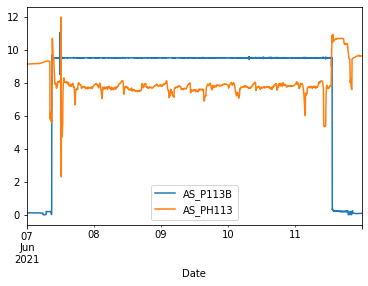

In [ ]:
plot1=a.plot(["AS_P113B","AS_PH113"]);

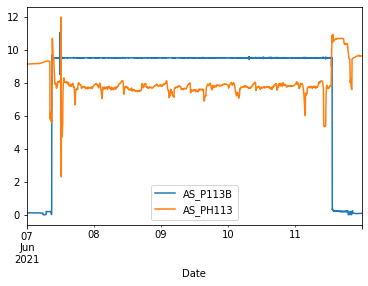

In [ ]:
a.DF[["AS_P113B","AS_PH113"]].plot()

In [ ]:
def plotter(df,columnlist,colorlist):
    import matplotlib.pyplot as plt
    plt.figure()
    plt.figure(figsize=(30,10))
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=14)
    plt.xlabel('time',fontsize=20)
    plt.ylabel(columnlist,fontsize=20)
    plt.title(f"{columnlist} vs. time",fontsize=20)
    targets = columnlist
    
    color = df.loc[:, colorlist].values
    plt.scatter(df.index,df[columnlist[0]] , c = "b", s = 0.5,)
    plt.scatter(df.index,df[columnlist[1]] , c = "r", s = 0.5,)
    
    #plt.colorbar()
    plt.legend(targets,prop={'size': 20})

<Figure size 432x288 with 0 Axes>

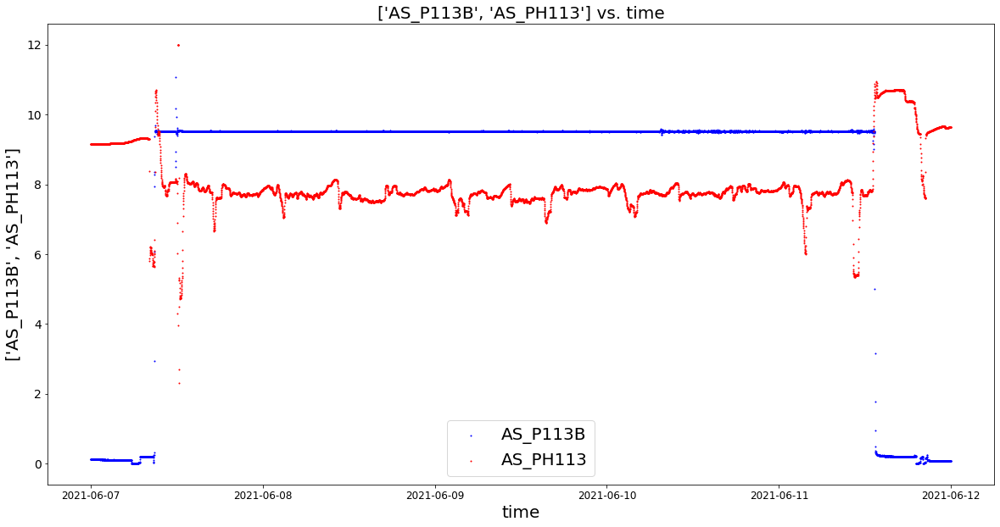

In [ ]:
a.plotter(["AS_P113B","AS_PH113"])

<Figure size 432x288 with 0 Axes>

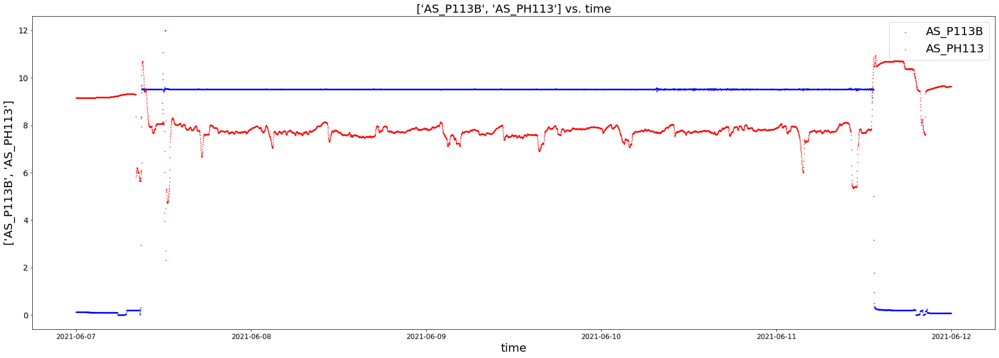

In [ ]:
plotter(a.DF,["AS_P113B","AS_PH113"],["AS_PH113"]) 

In [ ]:
import nltk
nltk.download('words')
from nltk.corpus import words
word_list = words.words()
# prints 236736
print (len(word_list))

[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.
236736


In [ ]:
pytho=[a for a in word_list if a.startswith("rop")]

In [ ]:
pytho

['ropable',
 'rope',
 'ropeable',
 'ropeband',
 'ropebark',
 'ropedance',
 'ropedancer',
 'ropedancing',
 'ropelayer',
 'ropelaying',
 'ropelike',
 'ropemaker',
 'ropemaking',
 'ropeman',
 'roper',
 'roperipe',
 'ropery',
 'ropes',
 'ropesmith',
 'ropetrick',
 'ropewalk',
 'ropewalker',
 'ropeway',
 'ropework',
 'ropily',
 'ropiness',
 'roping',
 'ropish',
 'ropishness',
 'ropp',
 'ropy']

In [ ]:
print(os.environ)

environ({'NO_GCE_CHECK': 'True', 'GCS_READ_CACHE_BLOCK_SIZE_MB': '16', 'CLOUDSDK_CONFIG': '/content/.config', 'CUDA_VERSION': '11.1.1', 'PATH': '/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin:/opt/bin', 'HOME': '/root', 'LD_LIBRARY_PATH': '/usr/local/nvidia/lib:/usr/local/nvidia/lib64', 'LANG': 'en_US.UTF-8', 'SHELL': '/bin/bash', 'LIBRARY_PATH': '/usr/local/cuda/lib64/stubs', 'SHLVL': '0', 'GCE_METADATA_TIMEOUT': '0', 'NCCL_VERSION': '2.7.8', 'NVIDIA_VISIBLE_DEVICES': 'all', 'DEBIAN_FRONTEND': 'noninteractive', 'CUDNN_VERSION': '8.0.5.39', 'LAST_FORCED_REBUILD': '20210929', 'JPY_PARENT_PID': '53', 'PYTHONPATH': '/env/python', 'DATALAB_SETTINGS_OVERRIDES': '{"kernelManagerProxyPort":6000,"kernelManagerProxyHost":"172.28.0.3","jupyterArgs":["--ip=\\"172.28.0.2\\""],"debugAdapterMultiplexerPath":"/usr/local/bin/dap_multiplexer","enableLsp":true}', 'ENV': '/root/.bashrc', 'GLIBCXX_FORCE_NEW

In [ ]:
!alfa="hello"
!export alfa="hello"

In [ ]:
import plotly.express as px
fig=px.scatter(x=a.DF.index,y=a.DF['AS_PH113'])

fig.show()



In [ ]:
def grafikon(fx,desc1,txt1,desc2="",txt2="",desc3="",txt3="" ,ngraf=1,c1='rgba(35,128,132,0.8)', c2='rgba(193,99,99,0.8)',c3='rgba(99,99,199,0.8)',title=None):
    '''
    fx: dataFrame
    desc1:column1
    txt1: label1
    desc2:column2
    txt2: label2
    ngraf: number of graph
    c1: color1
    c2: color2
    title: graph title
    '''
    
    #x_=[i for i in range(len(y_pred))]
    if title==None:
      title=txt1+","+txt2+","+txt3
    import plotly.express as px
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
    fig0 = make_subplots(rows=1, cols=1)
    
    fig0.add_trace(
        go.Scatter(x=fx.index, y=fx[desc1], name=txt1, line=dict(color=c1) ,showlegend=True  ),

        row=1, col=1

    )
    
    if ngraf>=2:
        fig0.add_trace(
            go.Scatter(x=fx.index, y=fx[desc2], name=txt2, line=dict(color=c2) ,showlegend=True  ),

            row=1, col=1
        )
    
    if ngraf==3:
        fig0.add_trace(
            go.Scatter(x=fx.index, y=fx[desc3], name=txt3, line=dict(color=c3) ,showlegend=True  ),

            row=1, col=1
        )
    

    fig0.update_layout(
        title=title,
        autosize=False,
        width=1200,
        height=800,
        
        )

    fig0.show()

In [ ]:
grafikon(a.DF,"AS_T1133","T3","AS_T1134","T4",ngraf=2)


In [ ]:
grafikon(a.DF,"AS_T1132","T2","AS_T1134","T4","AS_T113F","TF",ngraf=3)

In [ ]:
urls=[
"https://github.com/sipocz/XLS_Conv/raw/e409cb38b2f6f8528aff37e0b9712ea9f64f32c4/U113_20210503.xlsx",
"https://github.com/sipocz/XLS_Conv/raw/e409cb38b2f6f8528aff37e0b9712ea9f64f32c4/U113_20210510.xlsx",
"https://github.com/sipocz/XLS_Conv/raw/e409cb38b2f6f8528aff37e0b9712ea9f64f32c4/U113_20210517.xlsx",
"https://github.com/sipocz/XLS_Conv/raw/e409cb38b2f6f8528aff37e0b9712ea9f64f32c4/U113_20210531.xlsx",
"https://github.com/sipocz/XLS_Conv/raw/e052e5c75f5690d62793dc2f31af7d22b564e405/U113_20210607.xlsx",
"https://github.com/sipocz/XLS_Conv/raw/e052e5c75f5690d62793dc2f31af7d22b564e405/U113_20210614.xlsx",
"https://github.com/sipocz/XLS_Conv/raw/e052e5c75f5690d62793dc2f31af7d22b564e405/U113_20210621.xlsx",
"https://github.com/sipocz/XLS_Conv/raw/e052e5c75f5690d62793dc2f31af7d22b564e405/U113_20210628.xlsx",
"https://github.com/sipocz/XLS_Conv/raw/e052e5c75f5690d62793dc2f31af7d22b564e405/U113_20210705.xlsx",






]

In [ ]:
all_df=[]
for url in urls:
    !rm *.xlsx*
    urlname=url
    _,fname= os.path.split(urlname)
    !wget $urlname
    aa=XLS_timeseries(fname)
    aa.df_concat()
    aa.resample("10s")
    all_df.append(aa.DF)

--2021-10-03 09:19:12--  https://github.com/sipocz/XLS_Conv/raw/e409cb38b2f6f8528aff37e0b9712ea9f64f32c4/U113_20210503.xlsx
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/sipocz/XLS_Conv/e409cb38b2f6f8528aff37e0b9712ea9f64f32c4/U113_20210503.xlsx [following]
--2021-10-03 09:19:13--  https://raw.githubusercontent.com/sipocz/XLS_Conv/e409cb38b2f6f8528aff37e0b9712ea9f64f32c4/U113_20210503.xlsx
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4681597 (4.5M) [application/octet-stream]
Saving to: ‘U113_20210503.xlsx’

U113_20210503.xlsx  100%[===================>]   4.46M  --.-KB/s    in 0.08s   

202

In [ ]:
all_df

[                     AS_P113B   AS_PH113  ...   AS_T1134   AS_T1135
 Date                                      ...                      
 2021-05-03 05:34:10  0.000000  12.000000  ...  27.516514  29.477379
 2021-05-03 05:34:20  0.000000  12.000000  ...  27.545747  29.477379
 2021-05-03 05:34:30  0.000000  12.000000  ...  27.588023  29.477379
 2021-05-03 05:34:40  0.000000  12.000000  ...  27.597467  29.477379
 2021-05-03 05:34:50  0.000000  12.000000  ...  27.597467  29.477379
 ...                       ...        ...  ...        ...        ...
 2021-05-06 23:59:00  0.129796  10.250553  ...  51.062790  50.889662
 2021-05-06 23:59:10  0.127024  10.250553  ...  51.073288  50.855267
 2021-05-06 23:59:20  0.124953  10.250553  ...  51.011276  50.855267
 2021-05-06 23:59:30  0.129831  10.250553  ...  50.975739  50.855267
 2021-05-06 23:59:40  0.130007  10.250553  ...  50.954681  50.855267
 
 [32554 rows x 8 columns],
                      AS_P113B   AS_PH113  ...   AS_T1134   AS_T1135
 Date

In [ ]:
import pandas as pd

In [ ]:
DF_1=pd.DataFrame()


In [ ]:
all_df[0].head()

,AS_P113B,AS_PH113,AS_T113F,AS_T1131,AS_T1132,AS_T1133,AS_T1134,AS_T1135
Date,,,,,,,,
2021-05-03 05:34:10,0.0,12.0,30.743877,182.444495,182.446403,182.422751,27.516514,29.477379
2021-05-03 05:34:20,0.0,12.0,30.743877,73.600367,73.613442,73.440831,27.545747,29.477379
2021-05-03 05:34:30,0.0,12.0,30.746217,24.444954,24.447577,24.156097,27.588023,29.477379
2021-05-03 05:34:40,0.0,12.0,30.793480,24.444954,24.427762,24.128326,27.597467,29.477379
2021-05-03 05:34:50,0.0,12.0,30.762446,24.444954,24.453791,24.128326,27.597467,29.477379


In [ ]:
DF_1=all_df[0]
for dx in all_df:
    print(dx.head())
DF_2=pd.concat(all_df,sort=True)

                     AS_P113B  AS_PH113  ...   AS_T1134   AS_T1135
Date                                     ...                      
2021-05-03 05:34:10       0.0      12.0  ...  27.516514  29.477379
2021-05-03 05:34:20       0.0      12.0  ...  27.545747  29.477379
2021-05-03 05:34:30       0.0      12.0  ...  27.588023  29.477379
2021-05-03 05:34:40       0.0      12.0  ...  27.597467  29.477379
2021-05-03 05:34:50       0.0      12.0  ...  27.597467  29.477379

[5 rows x 8 columns]
                     AS_P113B   AS_PH113  ...   AS_T1134   AS_T1135
Date                                      ...                      
2021-05-10 05:32:00   2.43769  12.000000  ...  18.660225  20.221296
2021-05-10 05:32:10   0.00000  12.000000  ...  19.079882  20.634648
2021-05-10 05:32:20   0.00000  12.000000  ...  19.079882  20.666819
2021-05-10 05:32:30   0.00000  11.983371  ...  19.079882  20.666117
2021-05-10 05:32:40   0.00000  10.919097  ...  19.079882  20.621897

[5 rows x 8 columns]
           

In [ ]:
DF_2.sort_index()

,AS_P113B,AS_PH113,AS_T1131,AS_T1132,AS_T1133,AS_T1134,AS_T1135,AS_T113F
Date,,,,,,,,
2021-05-03 05:34:10,0.000000,12.000000,182.444495,182.446403,182.422751,27.516514,29.477379,30.743877
2021-05-03 05:34:20,0.000000,12.000000,73.600367,73.613442,73.440831,27.545747,29.477379,30.743877
2021-05-03 05:34:30,0.000000,12.000000,24.444954,24.447577,24.156097,27.588023,29.477379,30.746217
2021-05-03 05:34:40,0.000000,12.000000,24.444954,24.427762,24.128326,27.597467,29.477379,30.793480
2021-05-03 05:34:50,0.000000,12.000000,24.444954,24.453791,24.128326,27.597467,29.477379,30.762446
...,...,...,...,...,...,...,...,...
2021-07-09 23:59:00,0.022036,10.288899,28.385597,35.369623,30.605782,43.945984,43.689137,44.141300
2021-07-09 23:59:10,0.022431,10.291181,28.385597,35.349005,30.585754,43.945984,43.639126,44.139545
2021-07-09 23:59:20,0.022299,10.289426,28.385597,35.327070,30.536163,43.945984,43.628597,44.124629


In [ ]:
DF_2.to_csv("all_data.csv")

In [ ]:
grafikon(DF_2,"AS_T113F","T2","AS_T1134","T4","AS_T113F","TF",ngraf=3)

In [ ]:
DF_2.reindex()

In [ ]:
DF_2["weeknumber"]=DF_2.index.weekofyear

In [ ]:
DF_2

In [ ]:
tabs=["AS_P113B","AS_PH113","AS_T1131","AS_T1132","AS_T1133","AS_T1134","AS_T1135","AS_T113F"]
features=tabs
from sklearn.preprocessing import StandardScaler
x = dta = DF_2.loc[:, features].values
x = StandardScaler().fit_transform(x) # normalizing the features

In [ ]:
from sklearn.decomposition import PCA
pca_113 = PCA(n_components=2)
principal113 = pca_113.fit_transform(x)

In [ ]:
fig=px.scatter(x=principal113[:,0],y=principal113[:,1],color=DF_2.weeknumber,)

In [ ]:
fig.show()

In [ ]:
grafikon(DF_2,"AS_T113F","TF",ngraf=1)

In [ ]:
l1=DF_2["AS_T113F"] >165
aa=DF_2.loc[l1]

In [ ]:
tabs=["AS_P113B","AS_PH113","AS_T1131","AS_T1132","AS_T1133","AS_T1134","AS_T1135","AS_T113F"]
features=tabs
from sklearn.preprocessing import StandardScaler
x = dta = aa.loc[:, features].values
x = StandardScaler().fit_transform(x) # normalizing the features

In [ ]:
from sklearn.decomposition import PCA
pca_113 = PCA(n_components=2)
principal113 = pca_113.fit_transform(x)

In [ ]:
fig=px.scatter(x=principal113[:,0],y=principal113[:,1],color=aa.weeknumber,)

In [ ]:
fig.show()

In [ ]:
fig=px.line(x=principal113[:,0],y=principal113[:,1],color=aa.weeknumber,)

In [ ]:
    fig.update_layout(
        title="Elemzés",
        autosize=False,
        width=1200,
        height=800,
        
        )

In [ ]:
fig.show()

In [ ]:
!pip install hypertools

     |████████████████████████████████| 59 kB 3.3 MB/s 
     |████████████████████████████████| 80 kB 7.3 MB/s 
     |████████████████████████████████| 1.1 MB 18.2 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.1-py3-none-any.whl size=76564 sha256=37ac6c76974e1e9d17aedb25c5589bee303752ba89b89e5e05aa2e6d45d6420e
  Stored in directory: /root/.cache/pip/wheels/01/e7/bb/347dc0e510803d7116a13d592b10cc68262da56a8eec4dd72f
  Created wheel for pynndescent: filename=pynndescent-0.5.4-py3-none-any.whl size=52373 sha256=96cd554950376f7db40fc6c7e4c63bf6f81f7c0ea67b8b7e5554e51d41b4a27d
  Stored in directory: /root/.cache/pip/wheels/d0/5b/62/3401692ddad12324249c774c4b15ccb046946021e2b581c043
Successfully built umap-learn pynndescent


In [ ]:
# Code source: Andrew Heusser
# License: MIT

# load hypertools
import hypertools as hyp

# load the data


# process the data
data = hyp.analyze(dta, normalize='within', reduce='PCA', ndims=3,
                align='hyper')

# plot it
hyp.plot(data,animate=True)

<IPython.core.display.Javascript object>

In [ ]:
dta[0]

array([  9.60690768,   4.45084133,  71.49202728,  72.51468658,
       152.45765488, 171.68416809, 179.85015869, 165.56664505])

In [ ]:
dta[0]

array([  9.60690768,   4.45084133,  71.49202728,  72.51468658,
       152.45765488, 171.68416809, 179.85015869, 165.56664505])